In [1]:
import sys
sys.path.insert(0, "../kitti/")
from util_kitti import kitti_label_file_parser, kitti_calib_file_parser, get_corner_2D
from util_kitti import AVG_HEIGT, AVG_WIDTH, AVG_LENTH
from util_kitti import ANCHOR_Y_3D_MEAN, ANCHOR_Y_3D_STD, KITTI_Object, draw_2Dbox
from util_kitti import draw_corner_2D, draw_birdeyes, set_bev_background, init_img_plt, load_tf_image

import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from matplotlib.path import Path
import matplotlib.patches as patches

import torch
import pickle
import numpy as np 
from math import pi, atan2
import random 
import copy
import cv2
import pprint

ANCHOR_NAME = 'anchor_single_pixel'
INPUT_SHAPE = (288, 1280)

/home/lab530/anaconda3/envs/KenYuGAC/lib/python3.7/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# Anchor Generation

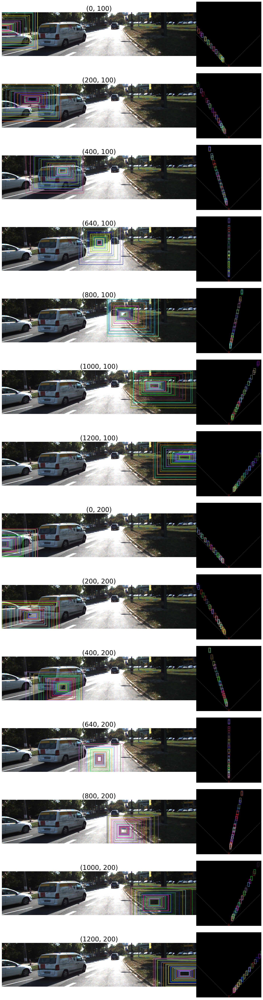

In [2]:
# %%script false --no-raise-error
'''
This script generate single pixelwise anchor for GAC network, it output "mean.npy", "std.npy", and "bb2d.npy" for GAC to use 
Note 
'''
# anchors_tensor.append([a.xmin, a.ymin, a.xmax, a.ymax, 0,
#                         a.cx, a.cy, a.cz, a.w, a.h, a.l, a.alpha,
#                         a.x3d, a.y3d, a.z3d, a.rot_y])
P2  = kitti_calib_file_parser("/home/lab530/KenYu/kitti/training/calib/000169.txt",
                              new_shape_tf = INPUT_SHAPE,
                              crop_tf = 100)
img = load_tf_image("/home/lab530/KenYu/kitti/training/image_2/000296.png") # 'A' type image

cx_cys = [(0, 100), (200, 100), (400, 100), (640, 100), (800, 100), (1000, 100), (1200, 100),
          (0, 200), (200, 200), (400, 200), (640, 200), (800, 200), (1000, 200), (1200, 200)]

# These setting is from GAC statistic result
cz_list = [56.98797991, 56.04226394,
           50.06823853, 48.19439468,
            43.91934331, 41.0492084 ,
            38.2276806 , 35.05968873,
            32.96152537, 30.32252282,
            29.04565675, 26.16832821,
            25.48751161, 23.05543279,
            22.13760396, 19.7498472 ,
            18.93810035, 16.81772621,
            16.1171727 , 14.24002636,
            13.79638931, 12.15158061,
            11.54314274, 10.13608401,
            9.17043185,  8.49685988,
            7.56959524,  7.34287524,
            6.78601669,  6.64104037,
            6.18923748,  6.20296784]

cz_std = [9.09031785, 9.38618033,
            9.54007986, 9.35654368,
            9.15279699, 8.71501209,
            8.52045028, 7.82572055,
            7.53118419, 6.79434155,
            6.53105367, 5.39632468,
            5.59955139, 4.47863999,
            5.01825271, 4.10331455,
            4.28522112, 3.62006981,
            3.52623707, 3.20755861,
            2.99044567, 3.03025413,
            2.94830599, 2.89681568,
            2.85578119, 2.50499439,
            2.30600518, 2.09231131,
            1.88066461, 1.74533658,
            1.566734  , 1.50293911]

bbox_2d = []

# Input: cx, cy, P2
# Output: z rot_y w, h, l, 2DBBOX
axs = init_img_plt([img]*len(cx_cys), titles = [f"({cx}, {cy})" for cx, cy in cx_cys])


# Draw Anchor on image
anchors_tensor = []
# print(f"(cx, cy) = {(cx, cy)}")
for i, cx_cy in enumerate(cx_cys):
    for cz in cz_list:
        cx, cy = cx_cy
        # Convert cx,cy,cz to x3d,y3d,z3d
        loc_3d = np.linalg.inv(P2[:, :3]) @ np.array([[cx*cz], [cy*cz], [cz]])
        loc_3d[1, 0] += AVG_HEIGT / 2.0 
        
        rot_y = pi/2
        str_line = f"Car NA NA NA NA NA NA NA {AVG_HEIGT} {AVG_WIDTH} {AVG_LENTH} {loc_3d[0, 0]} {loc_3d[1, 0]} {loc_3d[2, 0]} {rot_y} NA"
        # a = KITTI_Object(str_line, is_transform = False, center_2d = (cx,cy,cz)) # TODO center_2d is problemetic
        a = KITTI_Object(str_line, tf_matrix = P2)

        # 
        if cx_cy == (640, 100):
            w_2d = a.xmax - a.xmin
            h_2d = a.ymax - a.ymin
            bbox_2d.append([-w_2d/2, -h_2d/2, w_2d/2, h_2d/2])

        # Draw anchor
        rnd_color = (random.random(), random.random(), random.random())
        # draw_corner_2D(axs[i][0], a.corner_2D, color = rnd_color, is_draw_front = False)
        draw_2Dbox    (axs[i][0], (a.xmin, a.ymin, a.xmax, a.ymax), color = rnd_color)
        draw_birdeyes (axs[i][1], a, color = rnd_color)
        

# Output Single Pixel Anchor

In [3]:
%%script false --no-raise-error
# [cz, sin(alpha*2), cos(alpha*2), w, h , l]
alpha = 0
from math import sin, cos

# Get cz_std
# Reference from npy file 

# The w, h, l is from anchor_gac_original npy file
mean = np.array([[    cz, sin(2*alpha), cos(2*alpha), 1.62247087, 1.53504054, 3.90582067] for cz   in cz_list])
std  = np.array([[  cz_s,          0.5,          0.5, 0.10394107, 0.14244205, 0.44820999] for cz_s in cz_std])
# print(mean[0])
# print(std[0])
# print(bbox_2d)

np.save("gac_original_npy/mean.npy", mean)
np.save("gac_original_npy/std.npy", std)
np.save("gac_original_npy/2dbbox.npy", bbox_2d)


# Output Pyrimid Anchor

In [4]:
%%script false --no-raise-error
'''
This output the pixelwise anchor for pyrimid feature map,
Assuming we have 5 level of features and every pixel has 8 anchors
'''

# [cz, sin(alpha*2), cos(alpha*2), w, h , l]
from math import sin, cos
# Get cz_std
mean_dict = {}
std_dict = {}
bbox_2d_dict = {}

# Reference from npy file 
alpha = 0
for i, level in enumerate([3,4,5,6,7]):
    # print(cz_list[i*6: i*6 + 8])
    mean_dict[level] = np.array([[    cz, sin(2*alpha), cos(2*alpha), 1.62247087, 1.53504054, 3.90582067] for cz   in cz_list[i*6: i*6 + 8] ])
    std_dict[level]  = np.array([[  cz_s,          0.5,          0.5, 0.10394107, 0.14244205, 0.44820999] for cz_s in cz_std[i*6: i*6 + 8]])
    bbox_2d_dict[level]  = np.array([ bbox for bbox in bbox_2d[i*6: i*6 + 8]])

# print(mean_dict)
import pickle
with open("gac_original_pyrimid_npy/mean.pkl", 'wb') as f:
    pickle.dump(mean_dict,f)
with open("gac_original_pyrimid_npy/std.pkl", 'wb') as f:
    pickle.dump(std_dict,f)
with open("gac_original_pyrimid_npy/2dbbox.pkl", 'wb') as f:
    pickle.dump(bbox_2d_dict,f)


# Output ALL anchors

In [5]:
%%script false --no-raise-error
ANCHOR_NAME = "anchor_center3D"
# %%script false --no-raise-error
# anchors_tensor.append([a.xmin, a.ymin, a.xmax, a.ymax, 0, 
#                         a.cx, a.cy, a.cz, a.w, a.h, a.l, a.alpha,
#                         a.x3d, a.y3d, a.z3d, a.rot_y])

anchors_tensor = []
for y_f_idx in range(18):
    for x_f_idx in range(80):
        cx = x_f_idx * 16 + 8
        cy = y_f_idx * 16 + 8
        for i_cz, cz in enumerate(cz_list):
            # Convert cx,cy,cz to x3d,y3d,z3d
            loc_3d = np.linalg.inv(P2[:, :3]) @ np.array([[cx*cz], [cy*cz], [cz]])
            loc_3d[1, 0] += AVG_HEIGT / 2.0 
            
            # Filter unreasonable y_3d 
            # if not (func(cz, *popt_lower) < loc_3d[1, 0] < func(cz, *popt_upper)): continue

            rot_y = pi/2
            str_line = f"Car NA NA NA NA NA NA NA {AVG_HEIGT} {AVG_WIDTH} {AVG_LENTH} {loc_3d[0, 0]} {loc_3d[1, 0]} {loc_3d[2, 0]} {rot_y} NA"
            # a = KITTI_Object(str_line, is_transform = False, center_2d = (cx,cy,cz)) # TODO center_2d is problemetic
            a = KITTI_Object(str_line, tf_matrix = P2)
            
            # # Inject 2D bounding box
            # a.xmin = bbox_2d[i_cz][0] + cx
            # a.ymin = bbox_2d[i_cz][1] + cy
            # a.xmax = bbox_2d[i_cz][2] + cx
            # a.ymax = bbox_2d[i_cz][3] + cy
            
            # cz_list
            anchors_tensor.append(np.array([a.xmin, a.ymin, a.xmax, a.ymax, 0, a.cx, a.cy, a.cz, a.w, a.h, a.l, a.alpha, a.x3d, a.y3d, a.z3d, a.rot_y]))

anchors_tensor = np.array(anchors_tensor)
anchors_tensor = torch.FloatTensor(anchors_tensor)
print(f"anchors_tensor.shape = {anchors_tensor.shape}") # [14284, 12]

#####################
### Output Anchor ###
#####################

# 3D Anchor
with open(f"/home/lab530/KenYu/ml_toolkit/anchor_generation/pkl/{ANCHOR_NAME}.pkl", 'wb') as f:
    pickle.dump(anchors_tensor, f)
print(f"Write anchor result to {ANCHOR_NAME}.pkl")

# For 2D detector
with open(f"/home/lab530/KenYu/ml_toolkit/anchor_generation/pkl/{ANCHOR_NAME}_2D.pkl", 'wb') as f:
    pickle.dump(anchors_tensor[:, :4], f)
    # print(anchors_tensor[:, :4].shape) # torch.Size([20960, 4])
print(f"Write anchor result to {ANCHOR_NAME}_2D.pkl")

# Get anchor_map, TODO, temporarily allow all anchor
anchor_map = torch.ones((anchors_tensor.shape[0]), dtype=torch.bool)
print( f"Total number of anchor = {anchor_map.shape}" ) # torch.Size([30760])
with open(f"/home/lab530/KenYu/ml_toolkit/anchor_generation/pkl/{ANCHOR_NAME}_map.pkl", 'wb') as f:
    pickle.dump(anchor_map, f)
print(f"Write anchor result to {ANCHOR_NAME}_map.pkl")

In [6]:

print(P2)
fy = P2[1, 1]
cy = P2[1, 2] # 7.63
# Z = 80
# v = fy*1.71/Z + cy
# print(v) # 92 ~ 288

# for z in [6.1, 80]:
import numpy as np
for z in np.arange(6.1, 80, 1):
    # v = fy*1.71/z + cy
    # print(v)
    # print(v - cy)
    
    # C = fy*1.71
    
    print((z, -fy*1.71*z**(-2))) # pixel/m 
    print( 1292.1559425*z**(-2) )


# Z    = 6.1 ~ 80

# V    = 288.12 ~ 92.45
# v-cy = 280.49 ~ 16.15


[[ 7.55646755e+02  0.00000000e+00  6.38374831e+02  4.69778060e+01]
 [ 0.00000000e+00  7.55646755e+02  7.62980073e+01 -6.09610124e-02]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00  2.74588400e-03]]
(6.1, -34.72604006703966)
34.72603984144048
(7.1, -25.632929000090176)
25.632928833564772
(8.1, -19.69449704152638)
19.69449691358025
(9.1, -15.603863674611107)
15.603863573239948
(10.1, -12.666953738795666)
12.666953656504267
(11.1, -10.487427569958166)
10.48742750182615
(12.1, -8.825599008910222)
8.825598951574348
(13.1, -7.529607545565792)
7.52960749664938
(14.1, -6.499451490843246)
6.499451448619285
(15.1, -5.667102104708327)
5.66710206789176
(16.1, -4.984977241983509)
4.984977209598394
(17.1, -4.418986870813397)
4.418986842105262
(18.1, -3.944189587908017)
3.944189562284423
(19.1, -3.5419970694184517)
3.5419970464077184
(20.1, -3.198326652544604)
3.19832663176654
(21.1, -2.9023515889008458)
2.9023515700455964
(22.1, -2.6456377856607065)
2.645637768473209
(23.1, -2.4215362360048456)


# Pyrimid Anchor that strickly follow 2*N ratio (even_scale)


In [7]:
'''
'''
# [cz, sin(alpha*2), cos(alpha*2), w, h , l]
from math import sin, cos, sqrt
import os, glob 
import pprint

LABEL_DIR = "/home/lab530/KenYu/kitti/training/label_2/"
CALIB_DIR = "/home/lab530/KenYu/kitti/training/calib/"

sizes = [32, 64, 128, 256, 512]
# ratios = [0.5, 1, 2.0]
ratios = [1, 2.0, 3.0]
scales = [2**(0/3), 2**(1/3), 2**(2/3)]
PYRIMID_LEVEL = [3,4,5,6,7]

cluster_dict = {}
for size in sizes:
    for scale in scales:
        for ratio in ratios:
            # (w, h)
            base = scale * size # area = base**2
            cluster_dict[ f"size_{size}_ratio_{ratio}_scales_{round(scale, 2)}" ] = [base*sqrt(ratio), 
                                                                                     base/sqrt(ratio), 
                                                                                     []] # [w, h, [z3d, z3d ,z3d, ....]]

# Clustering
for fn in glob.glob(LABEL_DIR + "*.txt"):
    P2 = kitti_calib_file_parser( os.path.join(CALIB_DIR, fn.split("/")[-1]) )
    objs = kitti_label_file_parser(fn, P2)
    for obj in objs:
        if obj.category == "Car":
            width  = obj.xmax - obj.xmin
            height = obj.ymax - obj.ymin
            
            # Get cloest key
            cloest_key = None
            cloest_diff = 99999999999999999999
            for key in cluster_dict:
                diff = abs( width  - cluster_dict[key][0] ) + abs( height - cluster_dict[key][1] )
                if diff < cloest_diff:
                    cloest_key = key
                    cloest_diff = diff
            # 
            cluster_dict[cloest_key][2].append(obj.z3d)

from scipy.interpolate import interp1d
# Using GAC's STD
interp_func = interp1d(cz_list, cz_std)

alpha = 0
from collections import defaultdict

mean_dict = defaultdict(list)
std_dict = defaultdict(list)
bbox_2d_dict = defaultdict(list)

for i, level in enumerate(PYRIMID_LEVEL):
    size = sizes[i]
    
    for scale in scales:
        for ratio in ratios:
            key = f"size_{size}_ratio_{ratio}_scales_{round(scale, 2)}"

            # Get avg_z3d
            num_gt = len(cluster_dict[key][2])
            if num_gt != 0:
                avg_z3d = sum(cluster_dict[key][2]) / num_gt
                for z in cluster_dict[key][2]:
                    std_z3d = sqrt( (1/num_gt) * (z - avg_z3d)**2 )
            else:
                avg_z3d = 3
                std_z3d = 10

            try:
                std_z3d = interp_func(avg_z3d)
            except ValueError: 
                std_z3d = 10
            
            width, height = (cluster_dict[key][0], cluster_dict[key][1])
            
            mean_dict[level].append( [ avg_z3d, sin(2*alpha), cos(2*alpha), 1.62247087, 1.53504054, 3.90582067] )
            std_dict[level].append ( [ std_z3d,          0.5,          0.5, 0.10394107, 0.14244205, 0.44820999] )
            # std_dict[level].append ( [ interp_func(avg_z3d),          0.5,          0.5, 0.10394107, 0.14244205, 0.44820999] )
            bbox_2d_dict[level].append( [ -width/2, -height/2, width/2, height/2 ] )
    
    mean_dict[level]    = np.array(mean_dict[level])
    std_dict[level]     = np.array(std_dict[level])
    bbox_2d_dict[level] = np.array(bbox_2d_dict[level])

# import pprint 
# pprint.pprint(mean_dict)
# pprint.pprint(std_dict)
# pprint.pprint(bbox_2d_dict)

# import pickle
# with open("../anchor_generation/gac_original_pyrimid_anchor9_even_scale_npy/mean.pkl", 'wb') as f:
#     pickle.dump(mean_dict,f)
# with open("../anchor_generation/gac_original_pyrimid_anchor9_even_scale_npy/std.pkl", 'wb') as f:
#     pickle.dump(std_dict,f)
# with open("../anchor_generation/gac_original_pyrimid_anchor9_even_scale_npy/2dbbox.pkl", 'wb') as f:
#     pickle.dump(bbox_2d_dict,f)


# Visualize pyrimid anchor

level_0 has 51840 anchors
level_0 has average area of 2075.913406042767
level_1 has 12960 anchors
level_1 has average area of 8105.894212928
level_2 has 3240 anchors
level_2 has average area of 43284.7086064186
level_3 has 900 anchors
level_3 has average area of 495644.9060301542
level_4 has 270 anchors
level_4 has average area of 1225315.87004967


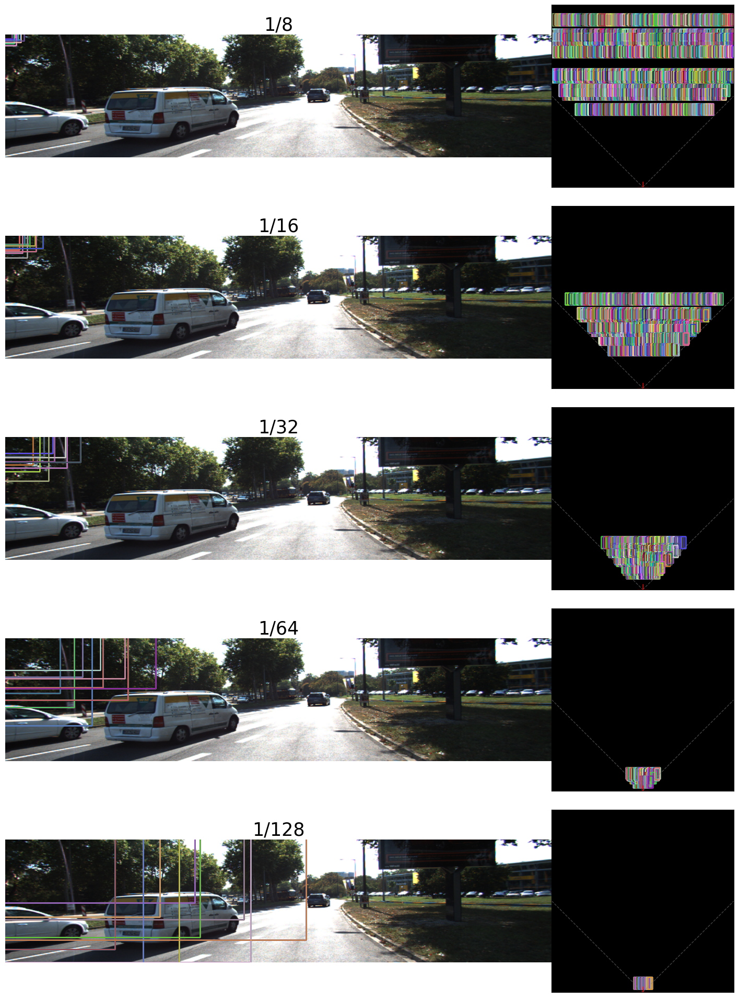

In [10]:

img = cv2.imread("/home/lab530/KenYu/kitti/training/image_2/000296.png") # 'A' type image
P2  = kitti_calib_file_parser("/home/lab530/KenYu/kitti/training/calib/000169.txt")
img_ori_h, img_ori_w, _ = img.shape
# Resize 
P2[0, :] *= INPUT_SHAPE[1]  / img_ori_w
P2[1, :] *= INPUT_SHAPE[0]  / img_ori_h

img = cv2.resize(img, (INPUT_SHAPE[1], INPUT_SHAPE[0]))
axs = init_img_plt([img]*5, titles = [f"1/{2**i}" for i in PYRIMID_LEVEL])

anchors_dict = {3: [],
                4: [],
                5: [],
                6: [],
                7: []}

feat_map_shape = {3: (36, 160), 4: (18, 80), 5:(9, 40), 6:(5, 20), 7:(3, 10) }
feat_map_strid = {3:         8, 4:       16, 5:     32, 6:     64, 7:    128 }

for pyrimid_level in PYRIMID_LEVEL:
    
    anchor_count = 0
    for y_f_idx in range( feat_map_shape[pyrimid_level][0] ):
        for x_f_idx in range( feat_map_shape[pyrimid_level][1] ):
            cx = x_f_idx * feat_map_strid[pyrimid_level] + feat_map_strid[pyrimid_level]/2
            cy = y_f_idx * feat_map_strid[pyrimid_level] + feat_map_strid[pyrimid_level]/2
            for i_box, (cz, _, _, _, _, _) in enumerate(mean_dict[pyrimid_level]):
                
                # Convert cx,cy,cz to x3d,y3d,z3d
                loc_3d = np.linalg.inv(P2[:, :3]) @ np.array([[cx*cz], [cy*cz], [cz]])
                loc_3d[1, 0] += AVG_HEIGT / 2.0 
                
                # TODO, for rot_y in [0, pi/2]:
                rot_y = pi/2
                str_line = f"Car NA NA NA NA NA NA NA {AVG_HEIGT} {AVG_WIDTH} {AVG_LENTH} {loc_3d[0, 0]} {loc_3d[1, 0]} {loc_3d[2, 0]} {rot_y} NA"
                # a = KITTI_Object(str_line, is_transform = False, center_2d = (cx,cy,cz)) # TODO center_2d is problemetic
                a = KITTI_Object(str_line, tf_matrix = P2)
                # 
                a.xmin = bbox_2d_dict[pyrimid_level][i_box, 0] + 640
                a.ymin = bbox_2d_dict[pyrimid_level][i_box, 1] + 144
                a.xmax = bbox_2d_dict[pyrimid_level][i_box, 2] + 640
                a.ymax = bbox_2d_dict[pyrimid_level][i_box, 3] + 144
                # 
                anchors_dict[pyrimid_level].append(a)
                
# Draw anchors
for i_level, pyrimid_level in enumerate(PYRIMID_LEVEL):
    print(f"level_{i_level} has {len(anchors_dict[pyrimid_level])} anchors") # , and every pixel has {} anchors")
    sum_area = 0
    for a in anchors_dict[pyrimid_level]:
        rnd_color = (random.random(), random.random(), random.random())
        # draw_corner_2D(axs[i_level][0], a.corner_2D, color = rnd_color, is_draw_front = False)
        draw_2Dbox    (axs[i_level][0], (a.xmin, a.ymin, a.xmax, a.ymax), color = rnd_color)
        draw_birdeyes (axs[i_level][1], a, color = rnd_color)
        sum_area += a.area
    print(f"level_{i_level} has average area of {sum_area / len(anchors_dict[pyrimid_level])}")
